### Import Libraries

In [6]:
!pip install -q ultralytics opencv-python-headless numpy scipy matplotlib tqdm ffmpeg-python filterpy lap

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 34.4 MB/s eta 0:00:00


In [7]:
import cv2
import numpy as np
from ultralytics import YOLO
from scipy.stats import entropy
from scipy.spatial import distance_matrix
from scipy.optimize import linear_sum_assignment
from filterpy.kalman import KalmanFilter
from tqdm import tqdm
import ffmpeg
import matplotlib.pyplot as plt
from IPython.display import HTML
from base64 import b64encode
import os

### Constants

In [8]:
VIDEO_IN = "/content/2431853-hd_1920_1080_25fps.mp4"
TEMP_OUT = "/content/temp_output.mp4"
FINAL_OUT = "/content/eco_entropy_output.mp4"
YOLO_WEIGHTS = "yolov8l.pt"
RESIZE_FACTOR = 2
BINS = 12
USE_GPU = True

# Tracker params
IOU_THRESH = 0.2
MAX_AGE = 15
MIN_HITS = 1

### Load Model with Weights

In [9]:
print("Loading model:", YOLO_WEIGHTS)
model = YOLO(YOLO_WEIGHTS)

Loading model: yolov8l.pt


### Video I/O

In [10]:
cap = cv2.VideoCapture(VIDEO_IN)
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
fps = cap.get(cv2.CAP_PROP_FPS) or 25.0
orig_w = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
orig_h = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
w = orig_w // RESIZE_FACTOR
h = orig_h // RESIZE_FACTOR

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(TEMP_OUT, fourcc, fps, (w, h))

## Tracker

In [11]:
def iou(bb1, bb2):
    """Compute IoU between two bbox (x1,y1,x2,y2)."""
    x1, y1, x2, y2 = bb1
    x1p, y1p, x2p, y2p = bb2

    xx1 = max(x1, x1p)
    yy1 = max(y1, y1p)
    xx2 = min(x2, x2p)
    yy2 = min(y2, y2p)

    w = max(0, xx2 - xx1)
    h_ = max(0, yy2 - yy1)

    inter = w * h_
    area1 = max(0, x2 - x1) * max(0, y2 - y1)
    area2 = max(0, x2p - x1p) * max(0, y2p - y1p)
    union = area1 + area2 - inter
    return inter / union if union > 0 else 0.0

class Track:
    def __init__(self, bbox, track_id):
        # bbox: [x1,y1,x2,y2] in resized coordinates
        self.track_id = track_id
        self.bbox = np.array(bbox, dtype=float)
        # Kalman filter state: [x, y, vx, vy] where x,y are centroid
        self.kf = KalmanFilter(dim_x=4, dim_z=2)
        dt = 1.0
        self.kf.F = np.array([[1,0,dt,0],
                              [0,1,0,dt],
                              [0,0,1,0],
                              [0,0,0,1]])
        self.kf.H = np.array([[1,0,0,0],
                              [0,1,0,0]])
        self.kf.P *= 10.0
        self.kf.R *= 1.0
        self.kf.Q *= 0.01

        cx = (self.bbox[0] + self.bbox[2]) / 2.0
        cy = (self.bbox[1] + self.bbox[3]) / 2.0
        self.kf.x = np.zeros((4,1))
        self.kf.x[0,0] = cx
        self.kf.x[1,0] = cy

        # bookkeeping
        self.age = 0
        self.hits = 1
        self.time_since_update = 0

        # motion histories
        self.history = []       # centroids (x,y)
        self.velocities = []    # speed magnitudes
        self.accelerations = []

    def predict(self):
        self.kf.predict()
        self.age += 1
        if self.time_since_update > 0:
            # append predicted centroid to history so there is continuity
            self.history.append((float(self.kf.x[0,0]), float(self.kf.x[1,0])))
        return (float(self.kf.x[0,0]), float(self.kf.x[1,0]))

    def update(self, bbox):
        # update with new detection bbox
        self.bbox = np.array(bbox, dtype=float)
        cx = (self.bbox[0] + self.bbox[2]) / 2.0
        cy = (self.bbox[1] + self.bbox[3]) / 2.0
        self.kf.update(np.array([cx, cy]))
        self.time_since_update = 0
        self.hits += 1
        # update history with corrected position
        self.history.append((float(self.kf.x[0,0]), float(self.kf.x[1,0])))

    def mark_missed(self):
        self.time_since_update += 1

class SORT:
    def __init__(self, max_age=MAX_AGE, min_hits=MIN_HITS, iou_thresh=IOU_THRESH):
        self.max_age = max_age
        self.min_hits = min_hits
        self.iou_thresh = iou_thresh
        self.tracks = []
        self.next_id = 0

    def update(self, detections):
        """
        detections: list of [x1,y1,x2,y2] in resized coords
        returns: list of Track objects (alive)
        """
        # 1. predict all tracks
        for t in self.tracks:
            t.predict()

        N = len(self.tracks)
        M = len(detections)

        if N > 0 and M > 0:
            # compute cost = 1 - IoU
            cost = np.zeros((N, M), dtype=float)
            for i, tr in enumerate(self.tracks):
                for j, det in enumerate(detections):
                    cost[i, j] = 1.0 - iou(tr.bbox, det)

            row_idx, col_idx = linear_sum_assignment(cost)
            assigned_tracks = set()
            assigned_dets = set()

            # apply assignment if IoU above threshold
            for r, c in zip(row_idx, col_idx):
                if 1.0 - cost[r, c] >= self.iou_thresh:
                    self.tracks[r].update(detections[c])
                    assigned_tracks.add(r)
                    assigned_dets.add(c)

            # unmatched detections -> new tracks
            for j, det in enumerate(detections):
                if j not in assigned_dets:
                    tr = Track(det, self.next_id)
                    self.next_id += 1
                    self.tracks.append(tr)

            # unmatched tracks -> mark missed
            for i, tr in enumerate(self.tracks):
                if i not in assigned_tracks:
                    tr.mark_missed()

        else:
            # no tracks or no detections: create tracks for all detections
            for det in detections:
                tr = Track(det, self.next_id)
                self.next_id += 1
                self.tracks.append(tr)
            # increment time since update for existing tracks when no detection
            for tr in self.tracks:
                tr.mark_missed()

        # remove dead tracks
        alive = []
        for tr in self.tracks:
            if tr.time_since_update <= self.max_age:
                alive.append(tr)
        self.tracks = alive

        return self.tracks

## convert YOLO result to list of bboxe

In [12]:
def yolo_results_to_bboxes(results):
    # results: the return of model(frame)
    # returns list of [x1,y1,x2,y2] in ints
    if results is None or len(results) == 0:
        return []
    boxes = results[0].boxes
    if boxes is None or len(boxes) == 0:
        return []
    xyxy = boxes.xyxy.cpu().numpy()  # shape (N, 4+) sometimes has conf/class after
    # ensure shape Nx4
    bboxes = []
    for row in xyxy:
        x1, y1, x2, y2 = float(row[0]), float(row[1]), float(row[2]), float(row[3])
        bboxes.append([x1, y1, x2, y2])
    return bboxes

### **Processing loop**

In [13]:
tracker = SORT()
frame_entropy_list = []
entropy_values = []
all_recent_velocities = []  # global sliding window of velocities
VELOCITY_WINDOW = 200       # how many recent velocities to use for histogram/entropy

print(f"Processing {total_frames} frames (resized {w}x{h}) ...")
frame_id = 0

for _ in tqdm(range(total_frames), desc="Frames"):
    ret, frame = cap.read()
    if not ret:
        break
    frame = cv2.resize(frame, (w, h))

    # YOLO detection (single frame)
    results = model(frame, verbose=False)
    detections = yolo_results_to_bboxes(results)

    # update tracker with detections
    tracks = tracker.update(detections)

    # per-frame lists
    frame_velocities = []

    # draw detection bboxes (optional) and tracker info
    for det in detections:
        x1,y1,x2,y2 = [int(v) for v in det]
        # lighter boxes for raw detections
        cv2.rectangle(frame, (x1,y1), (x2,y2), (60,60,60), 1)

    for tr in tracks:
        # centroid from KF (x,y)
        cx = float(tr.kf.x[0,0])
        cy = float(tr.kf.x[1,0])

        # compute velocity from history if possible
        if len(tr.history) >= 2:
            px, py = tr.history[-2]
            vx = cx - px
            vy = cy - py
            speed = np.sqrt(vx*vx + vy*vy)
            tr.velocities.append(speed)
            frame_velocities.append(speed)
            all_recent_velocities.append(speed)
            # acceleration
            if len(tr.velocities) >= 2:
                acc = tr.velocities[-1] - tr.velocities[-2]
                tr.accelerations.append(acc)

        # draw bbox and ID
        bx1, by1, bx2, by2 = [int(v) for v in tr.bbox]
        cv2.rectangle(frame, (bx1,by1), (bx2,by2), (16,200,16), 2)
        cv2.putText(frame, f"ID:{tr.track_id}", (int(cx), int(cy)-10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0,255,0), 1, cv2.LINE_AA)
        # optionally draw velocity arrow
        if len(tr.history) >= 1:
            px, py = tr.history[-1]
            # draw small arrow from previous to current predicted pos
            cv2.arrowedLine(frame, (int(px), int(py)), (int(cx), int(cy)), (255,200,0), 1, tipLength=0.3)

    # maintain sliding window
    if len(all_recent_velocities) > VELOCITY_WINDOW:
        all_recent_velocities = all_recent_velocities[-VELOCITY_WINDOW:]

    # compute histogram-based entropy across recent velocities (global)
    if len(all_recent_velocities) >= 5:
        hist, _ = np.histogram(all_recent_velocities, bins=BINS, density=True)
        S = float(entropy(hist + 1e-12))
    else:
        S = 0.0

    frame_entropy_list.append(S)
    entropy_values.append(S)

    # compute energy dispersion metric (assume unit mass)
    if len(all_recent_velocities) >= 5:
        E = 0.5 * np.array(all_recent_velocities)**2
        sigma_E2 = float(np.var(E))
    else:
        sigma_E2 = 0.0

    # overlay text and sparkline
    cv2.putText(frame, f"Entropy: {S:.4f}", (10, 26), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0,165,255), 2, cv2.LINE_AA)
    cv2.putText(frame, f"sigma_E2: {sigma_E2:.4f}", (10, 54), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,200), 2, cv2.LINE_AA)

    # rolling sparkline (like you had before)
    pad = 5
    spark_h = 60
    spark_w = 220
    spark_x = w - spark_w - pad
    spark_y = pad
    cv2.rectangle(frame, (spark_x-1, spark_y-1), (spark_x+spark_w+1, spark_y+spark_h+1), (20,20,20), -1)
    Nspark = min(100, len(entropy_values))
    if Nspark > 1:
        vals = np.array(entropy_values[-Nspark:])
        vmin = vals.min()
        vmax = vals.max() if vals.max() != vals.min() else vals.min() + 1e-6
        ys = spark_y + spark_h - ((vals - vmin) / (vmax - vmin + 1e-12) * (spark_h - 10)) - 5
        xs = np.linspace(spark_x+5, spark_x+spark_w-5, Nspark).astype(int)
        pts = np.vstack([xs, ys]).T.astype(int)
        for i in range(len(pts)-1):
            cv2.line(frame, tuple(pts[i]), tuple(pts[i+1]), (255,255,255), 1)

    out.write(frame)
    frame_id += 1

# release
cap.release()
out.release()

Processing 1513 frames (resized 960x540) ...


Frames: 100%|██████████| 1513/1513 [01:02<00:00, 24.04it/s]


### Re-encode to H.264 and Play the Output

In [15]:
print("Re-encoding to H.264 (final output)...")
(
    ffmpeg
    .input(TEMP_OUT)
    .output(FINAL_OUT, vcodec='libx264', pix_fmt='yuv420p', crf=23, loglevel="error")
    .run(overwrite_output=True)
)

# Display video inline (Colab/Jupyter)
mp4 = open(FINAL_OUT,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
display(HTML(f"""<video width=900 controls autoplay loop muted>
                <source src="{data_url}" type="video/mp4"></video>"""))

Re-encoding to H.264 (final output)...


### Plot Entropy

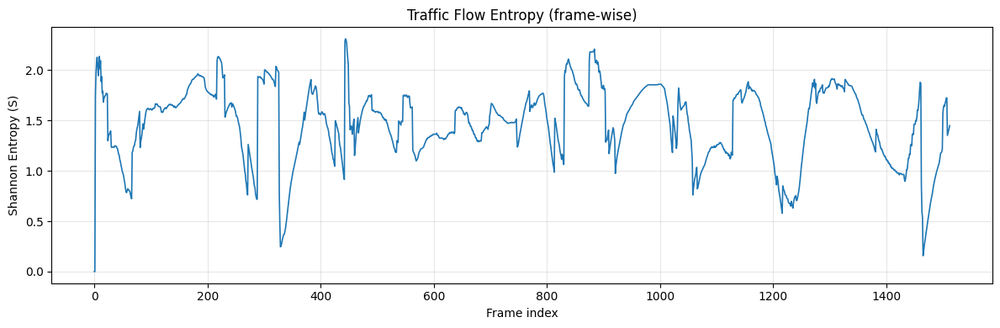

In [16]:
entropy_data = np.array(entropy_values)
plt.figure(figsize=(12,4))
plt.plot(entropy_data, linewidth=1.2)
plt.title("Traffic Flow Entropy (frame-wise)")
plt.xlabel("Frame index")
plt.ylabel("Shannon Entropy (S)")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


### Summary

In [17]:
mean_S = float(np.mean(entropy_data)) if len(entropy_data)>0 else 0.0
max_S = float(np.max(entropy_data)) if len(entropy_data)>0 else 0.0
min_S = float(np.min(entropy_data)) if len(entropy_data)>0 else 0.0
var_S = float(np.var(entropy_data)) if len(entropy_data)>0 else 0.0
print(f"Mean S: {mean_S:.4f}")
print(f"Max S: {max_S:.4f}")
print(f"Min S: {min_S:.4f}")
print(f"Var S: {var_S:.6f}")

Mean S: 1.4692
Max S: 2.3118
Min S: 0.0000
Var S: 0.136453


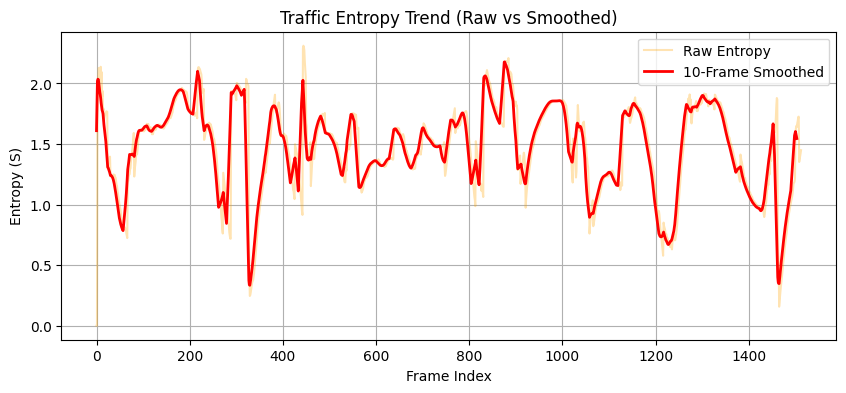

In [18]:
# smoothed trend
if len(entropy_data) >= 10:
    window = 10
    smooth_entropy = np.convolve(entropy_data, np.ones(window)/window, mode='valid')
    plt.figure(figsize=(10,4))
    plt.plot(entropy_data, color='orange', alpha=0.3, label='Raw Entropy')
    plt.plot(smooth_entropy, color='red', linewidth=2, label=f'{window}-Frame Smoothed')
    plt.title("Traffic Entropy Trend (Raw vs Smoothed)")
    plt.xlabel("Frame Index")
    plt.ylabel("Entropy (S)")
    plt.legend()
    plt.grid(True)
    plt.show()